In [4]:
import os
import sys
from glob import glob
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from collections import defaultdict
from utils import label_map_util
from utils import visualization_utils as vis_util
import random

%matplotlib inline
print("ok")

ok


In [5]:
def load_graph(graph_file):
    """Loads a frozen inference graph"""
    graph = tf.Graph()
    with graph.as_default():
        od_graph_def = tf.GraphDef()
        with tf.gfile.GFile(graph_file, 'rb') as fid:
            serialized_graph = fid.read()
            od_graph_def.ParseFromString(serialized_graph)
            tf.import_graph_def(od_graph_def, name='')
    return graph


def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)

In [51]:
## Test model
# PATH_TO_GRAPH = r'models/rcnn_resnet101/frozen_inference_graph.pb'
# PATH_TO_GRAPH = r'models/rcnn/frozen_inference_graph.pb'
PATH_TO_GRAPH = r'models/ssd_udacity/frozen_inference_graph_nikola.pb' ## load SSD trained on udacity's parking lot images
PATH_TO_LABELS = r'data/udacity_label_map.pbtxt'
NUM_CLASSES = 13

In [52]:
detection_graph = load_graph(PATH_TO_GRAPH)

In [53]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)
print(category_index)

{1: {'id': 1, 'name': 'Green'}, 2: {'id': 2, 'name': 'Red'}, 3: {'id': 3, 'name': 'Yellow'}, 4: {'id': 4, 'name': 'off'}}


In [54]:
IMAGE_SIZE = (12, 8)

data/udacity_testarea_rgb\left0094.jpg
SCORES
[ 0.97699547  0.0217953   0.00226259  0.00219241  0.00207101  0.0018378
  0.00181734  0.00176396  0.00170177  0.00168862]
CLASSES
[ 3.  3.  4.  4.  3.  4.  3.  2.  4.  4.]


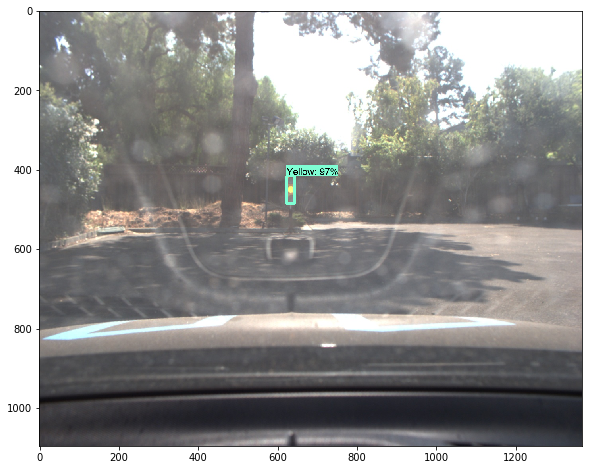

data/udacity_testarea_rgb\left0098.jpg
SCORES
[ 0.98658389  0.00180663  0.00174961  0.00172948  0.00172756  0.00165657
  0.00164104  0.0016371   0.00162431  0.00162383]
CLASSES
[ 3.  4.  1.  4.  3.  4.  4.  4.  3.  4.]


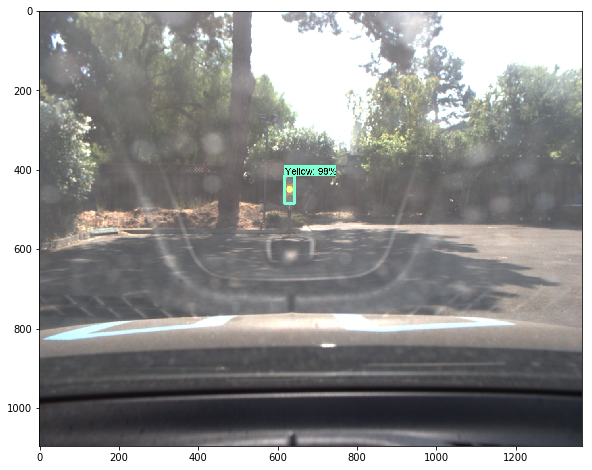

data/udacity_testarea_rgb\left0091.jpg
SCORES
[ 0.97166979  0.00176921  0.00174973  0.00172271  0.00168491  0.00163838
  0.0016084   0.00158941  0.00158619  0.00158352]
CLASSES
[ 3.  4.  3.  2.  4.  3.  2.  4.  4.  4.]


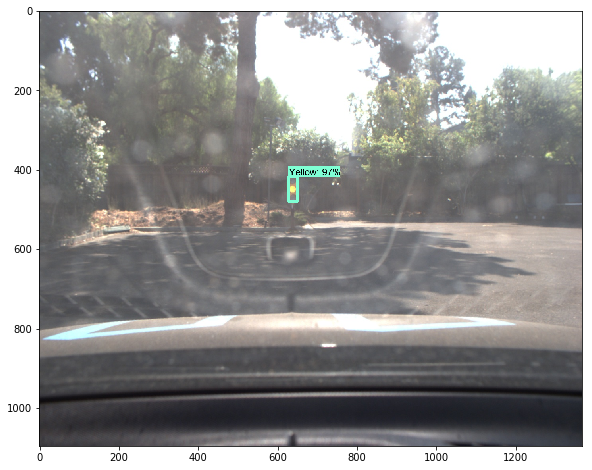

data/udacity_testarea_rgb\left0086.jpg
SCORES
[ 0.99414527  0.00223742  0.00197355  0.00187959  0.00187624  0.00181016
  0.00178258  0.00173356  0.00162035  0.0015754 ]
CLASSES
[ 3.  3.  3.  3.  4.  3.  2.  4.  4.  4.]


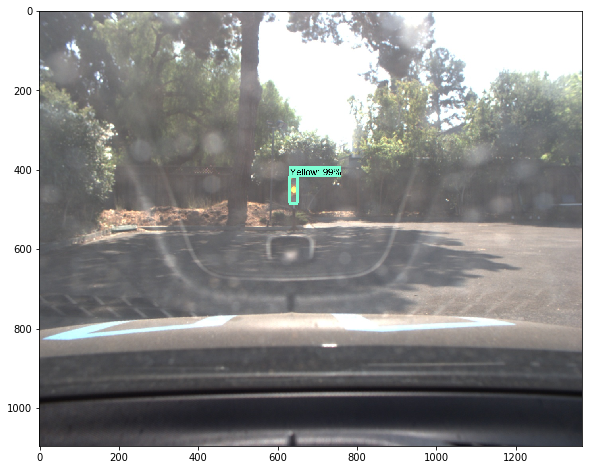

data/udacity_testarea_rgb\left0088.jpg
SCORES
[ 0.76959133  0.00181814  0.00171023  0.00162517  0.00152923  0.00149729
  0.0014957   0.00146981  0.00146358  0.00145337]
CLASSES
[ 3.  4.  4.  2.  1.  4.  4.  2.  4.  4.]


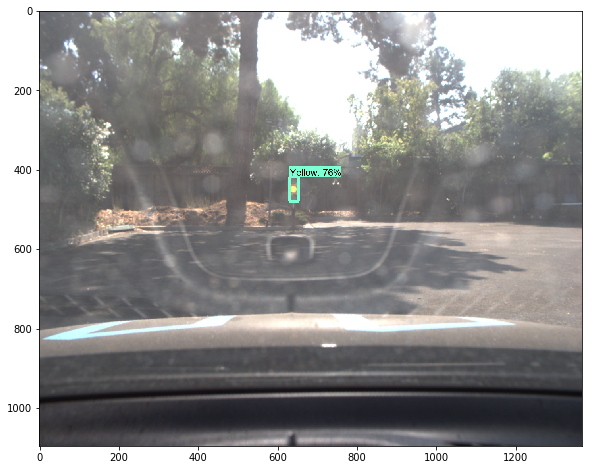

data/udacity_testarea_rgb\left0087.jpg
SCORES
[ 0.94592911  0.00273388  0.0019344   0.00190191  0.00172394  0.00166221
  0.00163763  0.00162836  0.00162059  0.00161885]
CLASSES
[ 3.  1.  3.  2.  4.  4.  1.  4.  4.  4.]


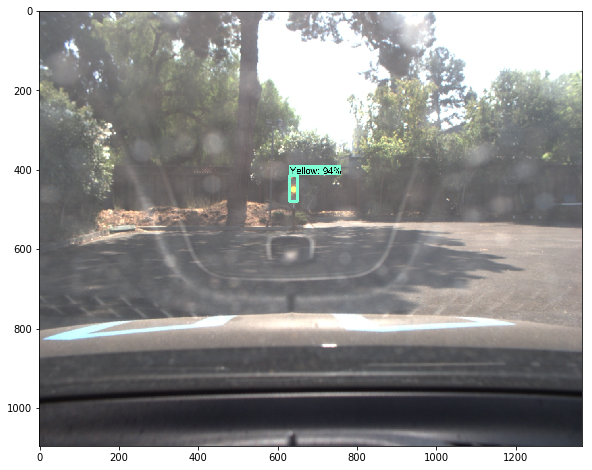

data/udacity_testarea_rgb\left0089.jpg
SCORES
[ 0.85630107  0.00212342  0.00181837  0.00175494  0.00172746  0.00168232
  0.0015634   0.00154694  0.00152809  0.00152578]
CLASSES
[ 3.  3.  1.  4.  1.  3.  4.  4.  4.  2.]


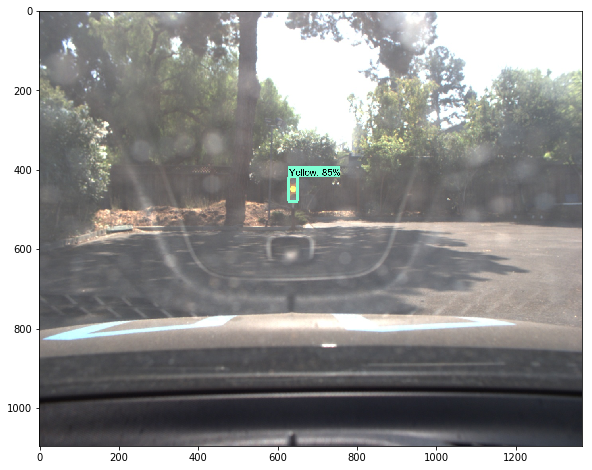

data/udacity_testarea_rgb\left0084.jpg
SCORES
[ 0.97826916  0.00288369  0.00183549  0.00177503  0.00170187  0.0016686
  0.00163788  0.00159025  0.00158074  0.00155635]
CLASSES
[ 3.  3.  4.  3.  4.  4.  4.  4.  4.  4.]


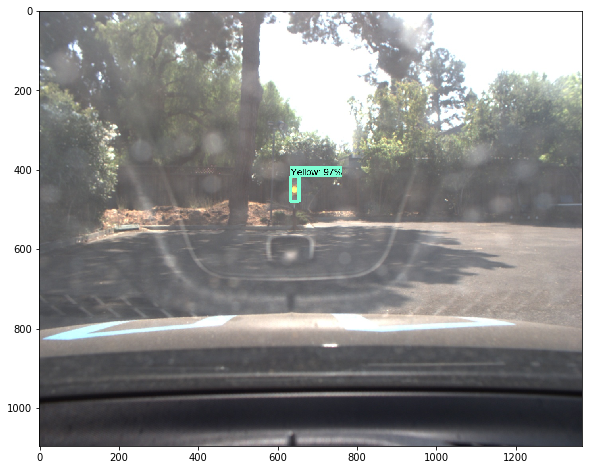

data/udacity_testarea_rgb\left0085.jpg
SCORES
[ 0.99576205  0.00187456  0.00183916  0.00170434  0.00169468  0.00167027
  0.00166741  0.0016636   0.00157962  0.00155711]
CLASSES
[ 3.  3.  3.  1.  1.  2.  4.  4.  3.  4.]


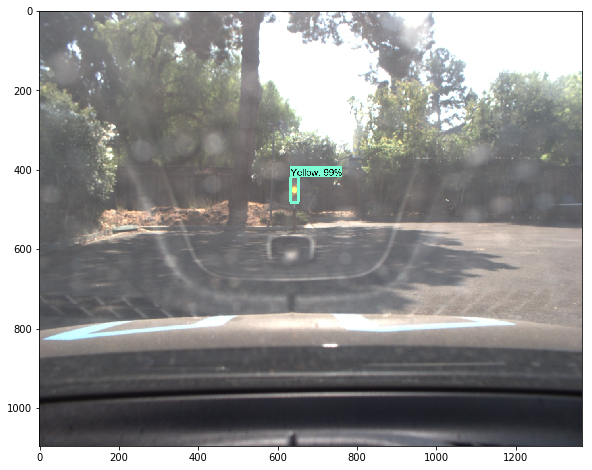

data/udacity_testarea_rgb\left0090.jpg
SCORES
[ 0.91190612  0.00234375  0.00207997  0.00195257  0.00180815  0.00175003
  0.00169216  0.00168164  0.00163135  0.00161616]
CLASSES
[ 3.  3.  4.  1.  1.  1.  2.  3.  3.  2.]


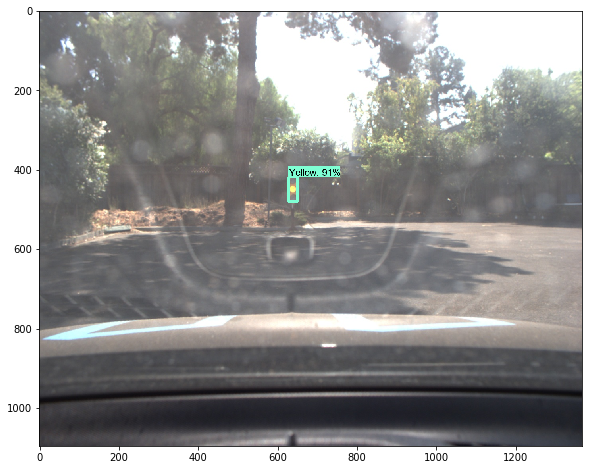

data/udacity_testarea_rgb\left0097.jpg
SCORES
[ 0.97018147  0.00254635  0.00185953  0.00179545  0.00167041  0.00166371
  0.00165208  0.00154107  0.00153521  0.00152848]
CLASSES
[ 3.  1.  4.  4.  4.  4.  4.  2.  4.  4.]


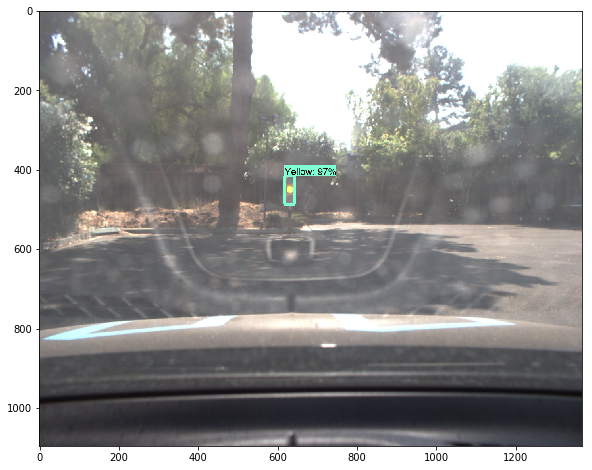

data/udacity_testarea_rgb\left0092.jpg
SCORES
[ 0.98435116  0.00224573  0.00208343  0.00181293  0.0016368   0.00162877
  0.0015707   0.00150127  0.00149088  0.00147342]
CLASSES
[ 3.  4.  2.  4.  3.  1.  2.  2.  2.  1.]


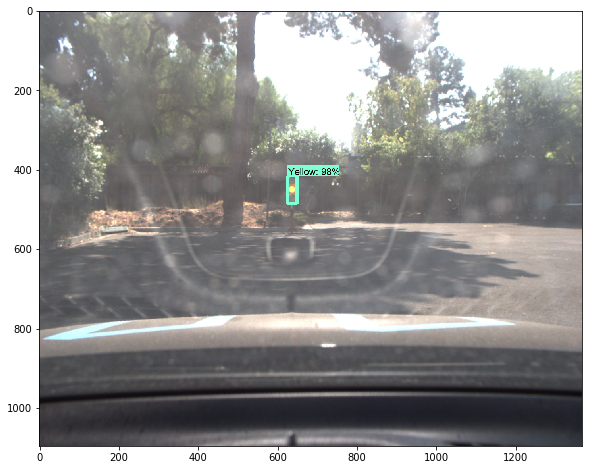

data/udacity_testarea_rgb\left0080.jpg
SCORES
[ 0.99301428  0.0028708   0.00209934  0.0020494   0.00174101  0.00172563
  0.00169252  0.00159411  0.00156816  0.00156783]
CLASSES
[ 3.  1.  3.  4.  4.  3.  4.  1.  3.  2.]


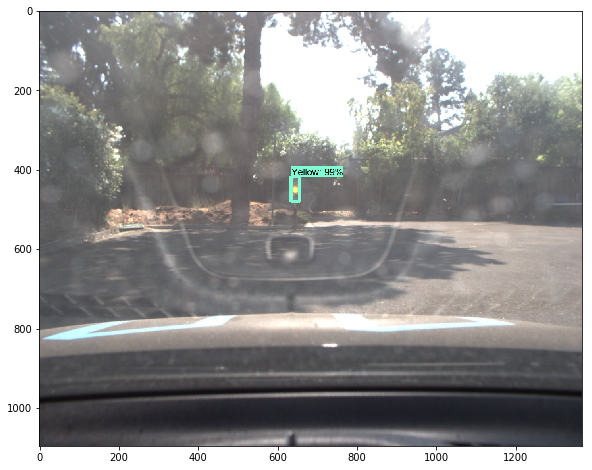

data/udacity_testarea_rgb\left0081.jpg
SCORES
[ 0.98961228  0.00500935  0.00224017  0.00171094  0.00153515  0.00152989
  0.00144951  0.00142747  0.00139545  0.00139234]
CLASSES
[ 3.  1.  3.  4.  2.  4.  4.  3.  2.  4.]


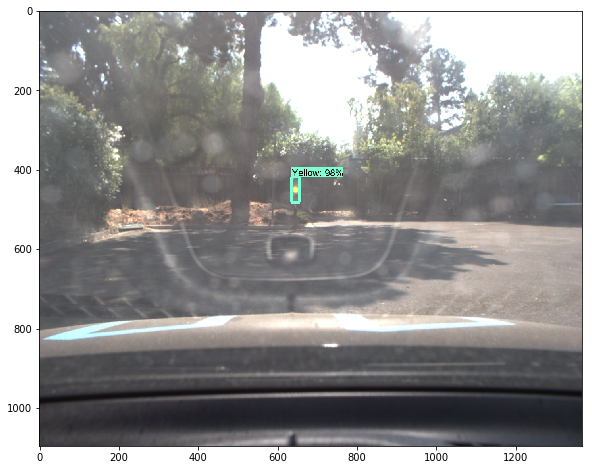

data/udacity_testarea_rgb\left0083.jpg
SCORES
[ 0.99448508  0.00259994  0.00236181  0.00159037  0.00158805  0.0015695
  0.00154811  0.00151842  0.00149996  0.00147642]
CLASSES
[ 3.  1.  3.  4.  4.  4.  4.  2.  4.  4.]


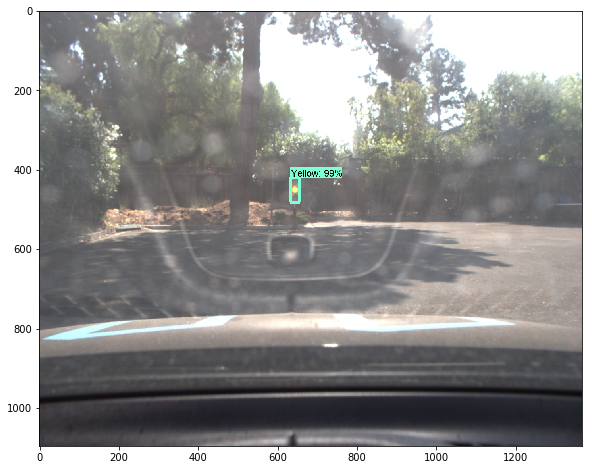

data/udacity_testarea_rgb\left0082.jpg
SCORES
[ 0.99377102  0.0024787   0.00193556  0.00190018  0.001694    0.0015944
  0.00150417  0.00149664  0.00148511  0.00148205]
CLASSES
[ 3.  1.  4.  4.  4.  4.  4.  2.  4.  3.]


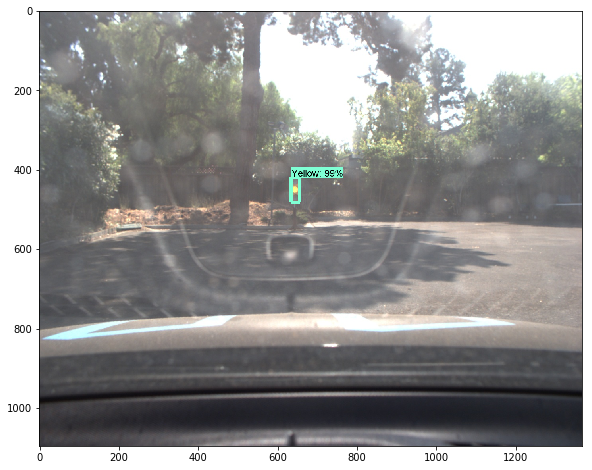

data/udacity_testarea_rgb\left0096.jpg
SCORES
[ 0.93008345  0.05285757  0.00238501  0.0022914   0.00194797  0.0018716
  0.00181404  0.0018079   0.00171114  0.00161336]
CLASSES
[ 3.  3.  3.  3.  4.  3.  4.  2.  4.  4.]


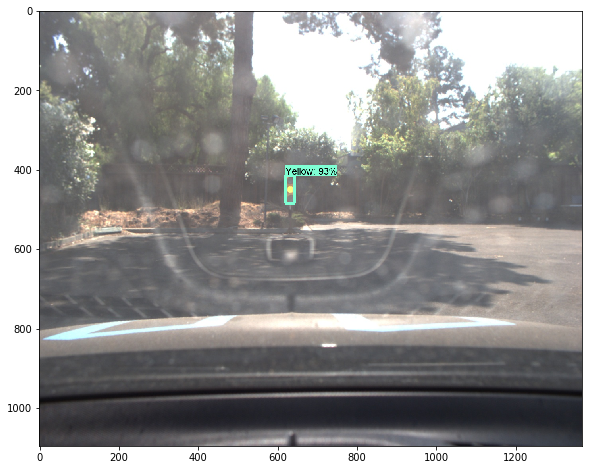

data/udacity_testarea_rgb\left0093.jpg
SCORES
[ 0.98394233  0.00201625  0.00177524  0.0017257   0.00169679  0.00158932
  0.00158536  0.00155997  0.00152694  0.00151149]
CLASSES
[ 3.  4.  3.  2.  1.  4.  2.  4.  4.  2.]


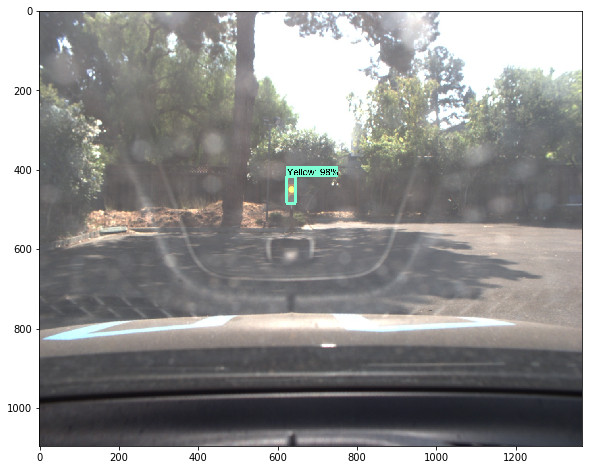

data/udacity_testarea_rgb\left0079.jpg
SCORES
[ 0.9936685   0.00179992  0.00176493  0.00174697  0.00170316  0.0017009
  0.00167095  0.00155562  0.00149458  0.00149442]
CLASSES
[ 3.  3.  4.  4.  2.  4.  4.  4.  4.  4.]


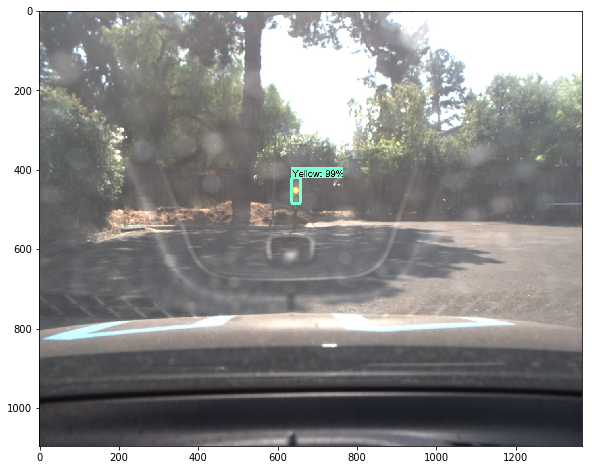

data/udacity_testarea_rgb\left0099.jpg
SCORES
[ 0.99826813  0.00390335  0.00244486  0.00243633  0.00241264  0.00213219
  0.00203669  0.00200762  0.00192562  0.00180546]
CLASSES
[ 3.  3.  1.  4.  3.  4.  4.  1.  1.  4.]


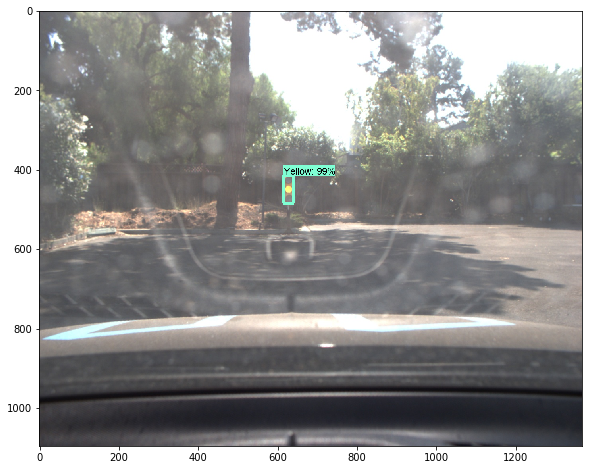

data/udacity_testarea_rgb\left0095.jpg
SCORES
[ 0.97729665  0.01052974  0.00208711  0.0019488   0.00173484  0.00170794
  0.00167991  0.00165676  0.00164942  0.00161162]
CLASSES
[ 3.  3.  4.  3.  3.  4.  4.  4.  4.  3.]


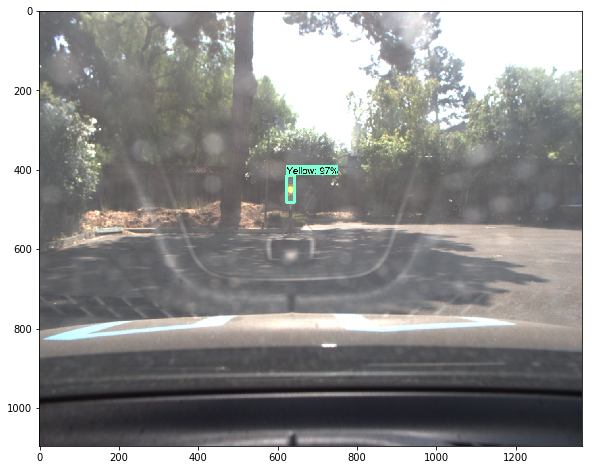

In [60]:
PATH_TO_IMGS = r'data/udacity_testarea_rgb'
TEST_IMGS = glob(os.path.join(PATH_TO_IMGS, r'*.jpg'))
random.shuffle(TEST_IMGS)

with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detect_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detect_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detect_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        #print(TEST_IMGS)
        for idx, img_path in enumerate(TEST_IMGS):
            print(img_path)
            image = Image.open(img_path)
            image_np = load_image_into_numpy_array(image)
            image_expanded = np.expand_dims(image_np, axis=0)
            
            (boxes, scores, classes, num) = sess.run(
                [detect_boxes, detect_scores, detect_classes, num_detections],
                feed_dict={image_tensor: image_expanded})
            
            print('SCORES')
            print(scores[0])
            print('CLASSES')
            print(classes[0])
            
            
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, 
                np.squeeze(boxes),
                np.squeeze(classes).astype(np.int32),
                np.squeeze(scores),
                category_index,
                use_normalized_coordinates=True,
                max_boxes_to_draw=5,
                line_thickness=8)
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()
            
            if idx == 20:#10
                break

In [13]:
PATH_TO_GRAPH = r'models/ssd_sim/frozen_inference_graph.pb' ## load SSD trained on udacity's simulator images
detection_graph = load_graph(PATH_TO_GRAPH)

Green
Red
Yellow
Unknown
21
0
SCORES
[ 0.99975926  0.35111898  0.24030375  0.19302349  0.12376578  0.04789217
  0.0166542   0.01369788  0.01363101  0.00639456]
CLASSES
[ 1.  1.  2.  1.  2.  2.  1.  1.  3.  1.]


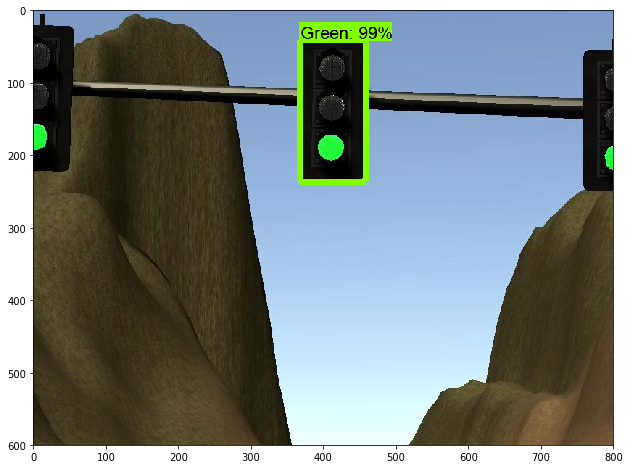

1
SCORES
[ 0.99970067  0.44401729  0.01954463  0.01252182  0.00936916  0.00698661
  0.00618571  0.00593094  0.00536484  0.00527744]
CLASSES
[ 2.  2.  2.  1.  1.  2.  2.  2.  3.  3.]


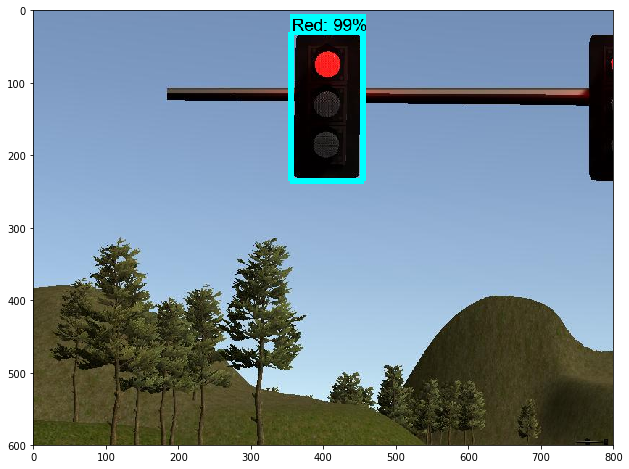

2
SCORES
[ 0.98176193  0.93579334  0.92219472  0.01446017  0.01036916  0.00910414
  0.00804061  0.00657452  0.00626513  0.00600124]
CLASSES
[ 3.  3.  3.  3.  3.  3.  2.  3.  3.  3.]


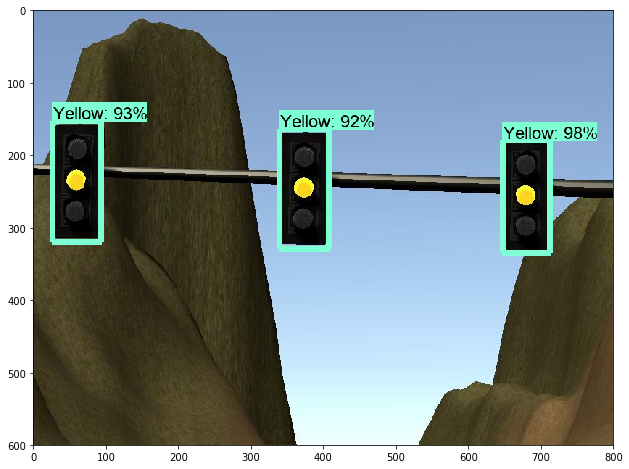

3
SCORES
[ 0.99929011  0.98403901  0.02384781  0.01233483  0.00817868  0.00640099
  0.00540419  0.00540127  0.00481461  0.0046009 ]
CLASSES
[ 3.  3.  3.  3.  3.  1.  3.  1.  1.  3.]


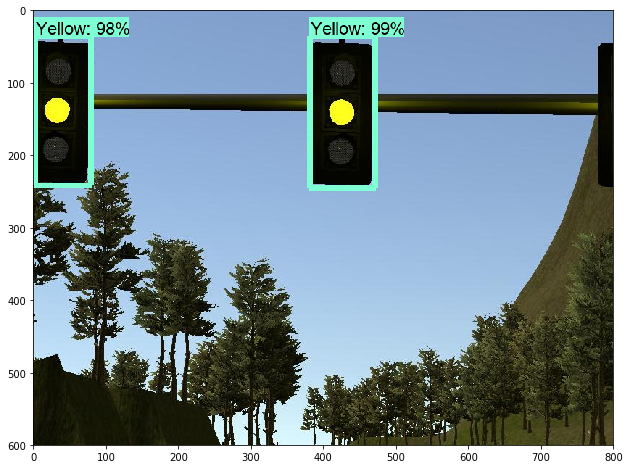

4
SCORES
[ 0.99969876  0.99964273  0.00547638  0.00541378  0.00511716  0.00510586
  0.00465698  0.00460313  0.00446768  0.00383839]
CLASSES
[ 1.  1.  1.  3.  4.  1.  3.  4.  1.  3.]


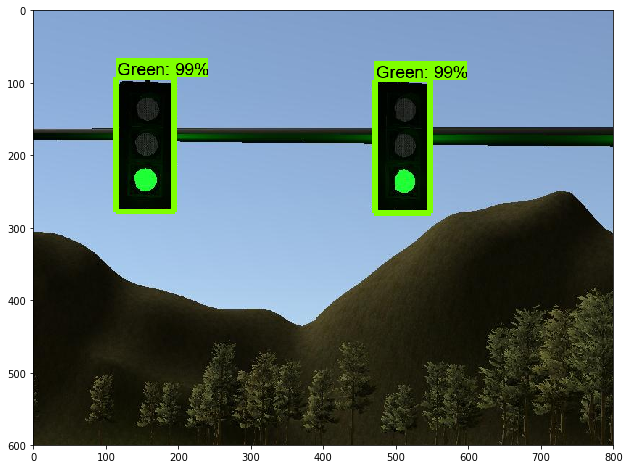

5
SCORES
[ 0.02474748  0.01829468  0.00890747  0.00650488  0.00645671  0.00632403
  0.00625366  0.00611661  0.00603835  0.00580552]
CLASSES
[ 2.  2.  3.  4.  2.  2.  1.  4.  4.  1.]


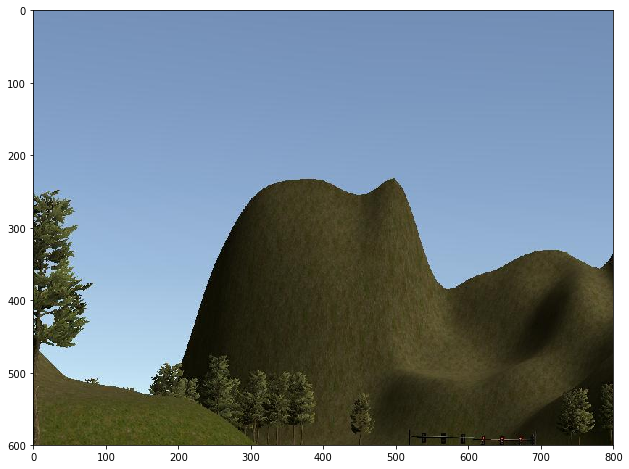

6
SCORES
[ 0.01335584  0.00835792  0.00835627  0.00824303  0.00567231  0.00544499
  0.00508319  0.00502751  0.00473209  0.00466095]
CLASSES
[ 2.  4.  4.  2.  4.  4.  1.  1.  4.  4.]


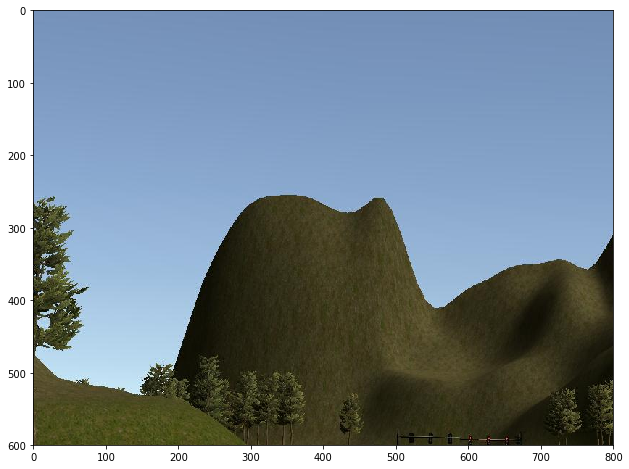

7
SCORES
[ 0.5923115   0.53149909  0.15404885  0.00872084  0.00768325  0.00709783
  0.00581241  0.00538306  0.00532487  0.0050338 ]
CLASSES
[ 3.  3.  3.  3.  3.  4.  4.  3.  3.  3.]


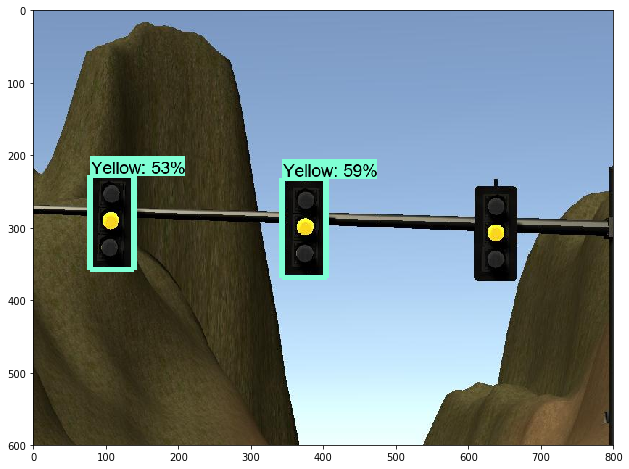

8
SCORES
[ 0.00720356  0.00661575  0.00612641  0.00601123  0.00577566  0.00498326
  0.00490218  0.00431772  0.00416982  0.00414932]
CLASSES
[ 1.  4.  2.  3.  1.  1.  2.  3.  4.  4.]


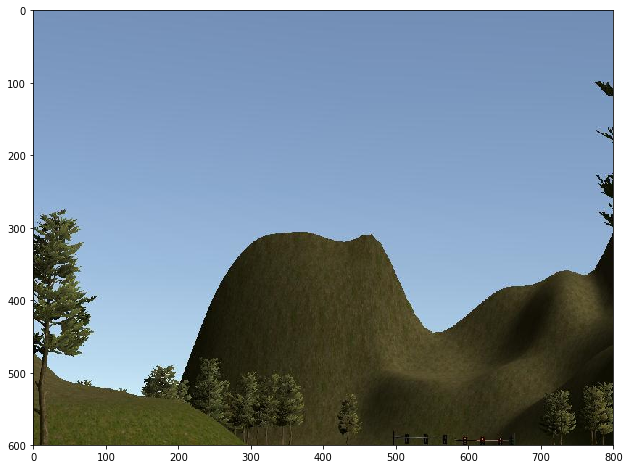

9
SCORES
[ 0.99865556  0.99803787  0.99240416  0.01141319  0.00955646  0.00564224
  0.00544441  0.00535421  0.00510379  0.00486616]
CLASSES
[ 1.  1.  1.  2.  2.  2.  1.  4.  4.  2.]


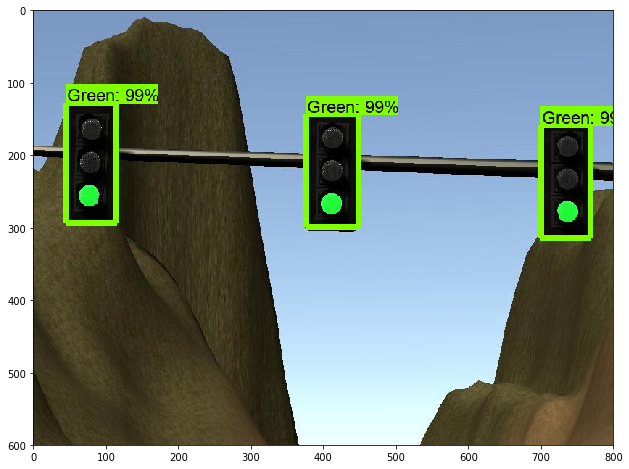

10
SCORES
[ 0.99567527  0.99567348  0.99214137  0.0095573   0.00732861  0.00724532
  0.00697094  0.00644092  0.00589904  0.00583646]
CLASSES
[ 3.  3.  3.  3.  3.  3.  3.  3.  3.  3.]


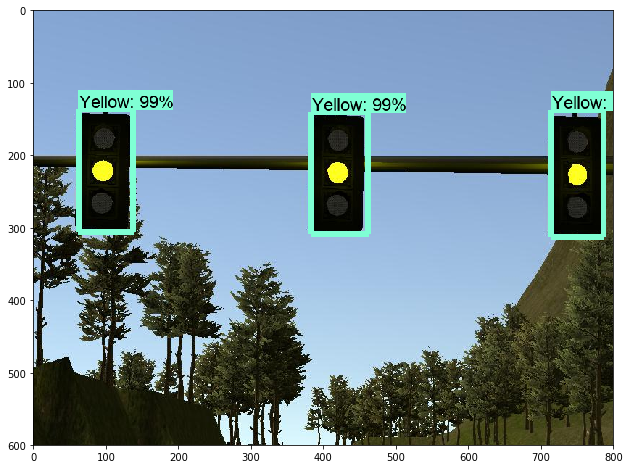

In [20]:
PATH_TO_IMGS = r'data/simulator_dataset_rgb'
subfolder = ['Green', 'Red', 'Yellow', 'Unknown']
TEST_IMGS = []
for i in subfolder:
    TEST_IMGS += glob(os.path.join(os.path.join(PATH_TO_IMGS, i), r'*.png'))
    print(i)
random.shuffle(TEST_IMGS)
print(len(TEST_IMGS))
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detect_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detect_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detect_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        
        for idx, img_path in enumerate(TEST_IMGS):
            print(idx)
            image = Image.open(img_path)
            image_np = load_image_into_numpy_array(image)
            image_expanded = np.expand_dims(image_np, axis=0)
            
            (boxes, scores, classes, num) = sess.run(
                [detect_boxes, detect_scores, detect_classes, num_detections],
                feed_dict={image_tensor: image_expanded})
            
            print('SCORES')
            print(scores[0])
            print('CLASSES')
            print(classes[0])
            
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, 
                np.squeeze(boxes),
                np.squeeze(classes).astype(np.int32),
                np.squeeze(scores),
                category_index,
                use_normalized_coordinates=True,
                max_boxes_to_draw=5,
                line_thickness=8)
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()
            
            if idx == 10:
                break